In [1]:
from rep2mut_lib import *
import pandas as pd

In [ ]:
#You should firt provide the vectors, provide the dataset that you want to test, then execute the cross validation script.
#If you did not generate the vectors please run this command:
#python ../generate_vectors.py -s data/sequence_v2.txt -f data/dataset_to_seq.xlsx -m data/NIHMS1014772-supplement-Supplemental_2.xlsx
#If you did not download the dataset, please run this command:
#../get_data.sh

In [5]:
vectors = pickle.load(open("../vectors.p","rb")) #Upload the vectors

############################################################################################################
#datasets = ['BRCA1_HUMAN_BRCT', 'B3VI55_LIPSTSTABLE', 'BLAT_ECOLX_Ranganathan2015', 
#'RL401_YEAST_Fraser2016', 'CALM1_HUMAN_Roth2017', 
#'UBC9_HUMAN_Roth2017', 'SUMO1_HUMAN_Roth2017', 'RASH_HUMAN_Kuriyan', 
#'BG_STRSQ_hmmerbit', 'MK01_HUMAN_Johannessen','RL401_YEAST_Bolon2014',  
#'HSP82_YEAST_Bolon2016', 'YAP1_HUMAN_Fields2012-singles', 'BF520_env_Bloom2018', 
#'UBE4B_MOUSE_Klevit2013-singles', 'HG_FLU_Bloom2016', 'B3VI55_LIPST_Whitehead2015', 
#'BLAT_ECOLX_Palzkill2012', 'GAL4_YEAST_Shendure2015', 'TIM_SULSO_b0', 'POLG_HCVJF_Sun2014', 
#'TPMT_HUMAN_Fowler2018', 'DLG4_RAT_Ranganathan2012', 'MTH3_HAEAESTABILIZED_Tawfik2015', 'AMIE_PSEAE_Whitehead', 
#'BLAT_ECOLX_Tenaillon2013', 'BLAT_ECOLX_Ostermeier2014', 'BRCA1_HUMAN_RING', 'P84126_THETH_b0', 
#'PTEN_HUMAN_Fowler2018', 'PABP_YEAST_Fields2013-singles', 'IF1_ECOLI_Kishony', 
#'PA_FLU_Sun2015', 'RL401_YEAST_Bolon2013', 'TIM_THEMA_b0', 'BG505_env_Bloom2018', 'TPK1_HUMAN_Roth2017']
############################################################################################################


dataset = 'BLAT_ECOLX_Ranganathan2015' # Choose one dataset

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
rr1, rr2, mutations = cross_validation({dataset :vectors[dataset]}, device, dataset )



training the model:  0
This 0 loss: 0.25131773774347776 for ep 282
training the model:  1
This 1 loss: 0.24330265119823438 for ep 281
training the model:  2
This 2 loss: 0.2438876441327611 for ep 282
training the model:  3
This 3 loss: 0.2401198085457942 for ep 281
training the model:  4
This 4 loss: 0.2405177147032049 for ep 281
training the model:  5
This 5 loss: 0.2376515189218832 for ep 282
training the model:  6
This 6 loss: 0.24706371356929735 for ep 281
training the model:  7
This 7 loss: 0.24362650547547554 for ep 282
training the model:  8
This 8 loss: 0.24635718441831028 for ep 281
training the model:  9
This 9 loss: 0.24236001686530548 for ep 281


In [ ]:
#You can generate the scatter plot using this script

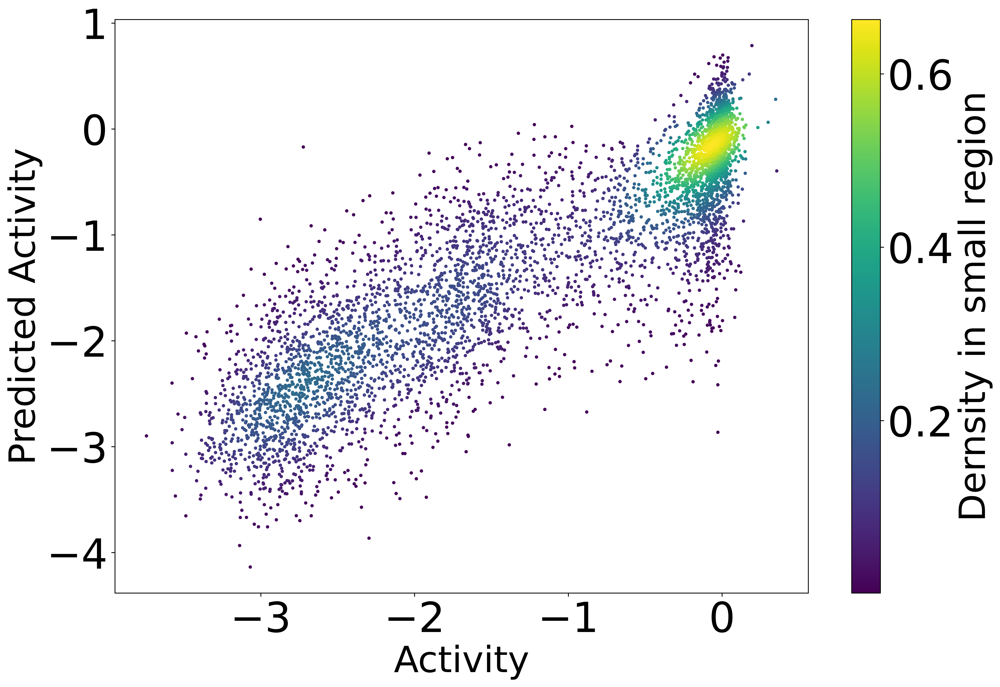

In [6]:
lsize=35
nsize=40


xy = np.vstack([rr2,rr1])
z = gaussian_kde(xy)(xy)
fig = plt.figure(figsize=(15, 10), dpi=600)
plt.scatter( rr2, rr1, c=z, s=5)

cb = plt.colorbar()
cb.set_label(label="Dernsity in small region", size=35)
cb.ax.tick_params(labelsize=40)

plt.xlabel('Activity', fontsize=35)
plt.ylabel('Predicted Activity', fontsize=35)
plt.tick_params(axis='both', which='major', labelsize=40)
#plt.savefig(dataset+".jpg")
plt.show()   

In [ ]:
#You can also compute the corrolation from here

In [7]:
print(GetCorrelation(rr2, rr1))

{'Pearson': 0.8797150549951883, 'Spearman': 0.8776815585043675}


In [ ]:
#To regenrate esm results, run this command, if you did not download esm, please run:
#git clone https://github.com/facebookresearch/esm.git ~

In [8]:
!python ~/esm/examples/variant-prediction/predict.py \
    --model-location esm1v_t33_650M_UR90S_1 \
    --sequence HPETLVKVKDAEDQLGARVGYIELDLNSGKILESFRPEERFPMMSTFKVLLCGAVLSRVDAGQEQLGRRIHYSQNDLVEYSPVTEKHLTDGMTVRELCSAAITMSDNTAANLLLTTIGGPKELTAFLHNMGDHVTRLDRWEPELNEAIPNDERDTTMPAAMATTLRKLLTGELLTLASRQQLIDWMEADKVAGPLLRSALPAGWFIADKSGAGERGSRGIIAALGPDGKPSRIVVIYTTGSQATMDERNRQIAEIGASLIKHW \
    --dms-input ~/esm/esm/examples/variant-prediction/data/BLAT_ECOLX_Ranganathan2015.csv \
    --mutation-col mutant \
    --dms-output ./data/BLAT_ECOLX_Ranganathan2015_labeled.csv \
    --offset-idx 24 \
    --scoring-strategy masked-marginals \
    --msa-path ./data/BLAT_ECOLX_1_b0.5.a3m

/home/derbelh/anaconda3/lib/python3.9/site-packages/esm/pretrained.py:215: UserWarning: Regression weights not found, predicting contacts will not produce correct results.
  warnings.warn(
Transferred model to GPU
100%|█████████████████████████████████████████| 265/265 [00:09<00:00, 28.25it/s]


In [ ]:
#We will generate the performance of both esm and DeepSequence

In [9]:
m_excel_sheets = "./data/BLAT_ECOLX_Ranganathan2015_labeled.csv"

BLAT_ECOLX_Ranganathan2015 = pd.read_csv(m_excel_sheets)

x2 = BLAT_ECOLX_Ranganathan2015.dropna(subset=['mutation_effect_prediction_vae_ensemble'])

x2 = x2.rename(columns={"2500": "Activity"})

x2 = x2.rename(columns={"mutation_effect_prediction_vae_ensemble": "Predicted Activity"})

x4 = x2.rename(columns={"esm1v_t33_650M_UR90S_1": "Predicted Activity2"})

In [ ]:
#First DeepSequence

{'Pearson': 0.754138841665945, 'Spearman': 0.7755001128993768}


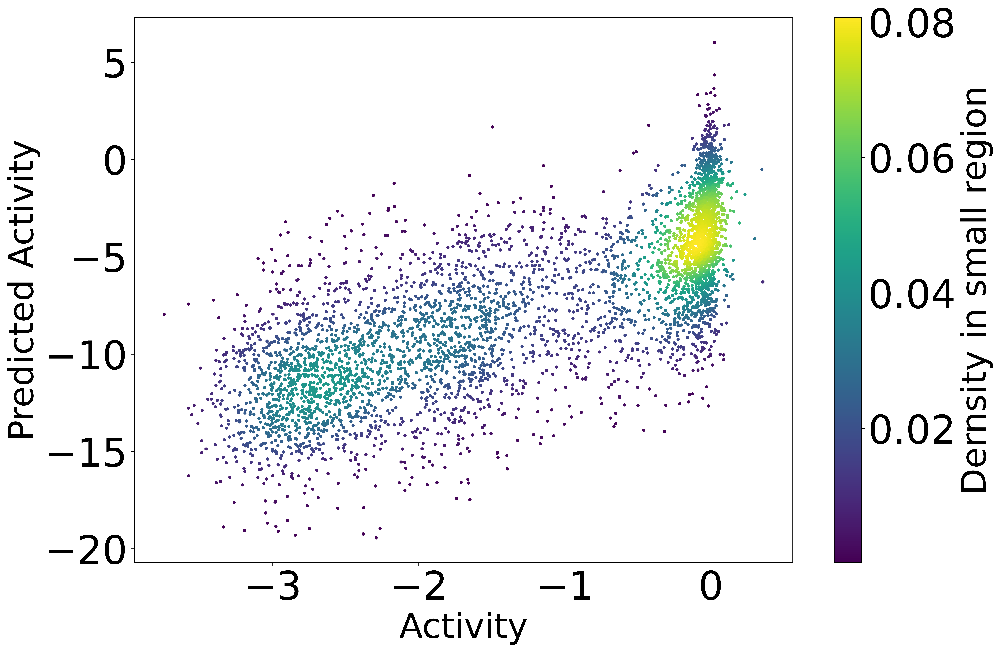

In [10]:
r2 = x2['Activity']
r1 = x2["Predicted Activity"]
xy = np.vstack([r2,r1])
z = gaussian_kde(xy)(xy)
fig = plt.figure(figsize=(15, 10), dpi=600)
plt.scatter( r2, r1, c=z, s=5)

cb = plt.colorbar()
cb.set_label(label="Dernsity in small region", size=lsize)
cb.ax.tick_params(labelsize=nsize)
plt.xlabel('Activity', fontsize=lsize)
plt.ylabel('Predicted Activity', fontsize=lsize)
plt.tick_params(axis='both', which='major', labelsize=nsize)


def GetCorrelation(d1, d2):
    perf = {}
    pearson = scipy.stats.pearsonr(d1, d2)[0]
    spearman = scipy.stats.spearmanr(d1, d2)[0]
    perf = {'Pearson':pearson,'Spearman':spearman}
    return perf

print(GetCorrelation(r2, r1))

plt.show()

In [ ]:
#Then esm

{'Pearson': 0.6741330605014779, 'Spearman': 0.6895988082032446}


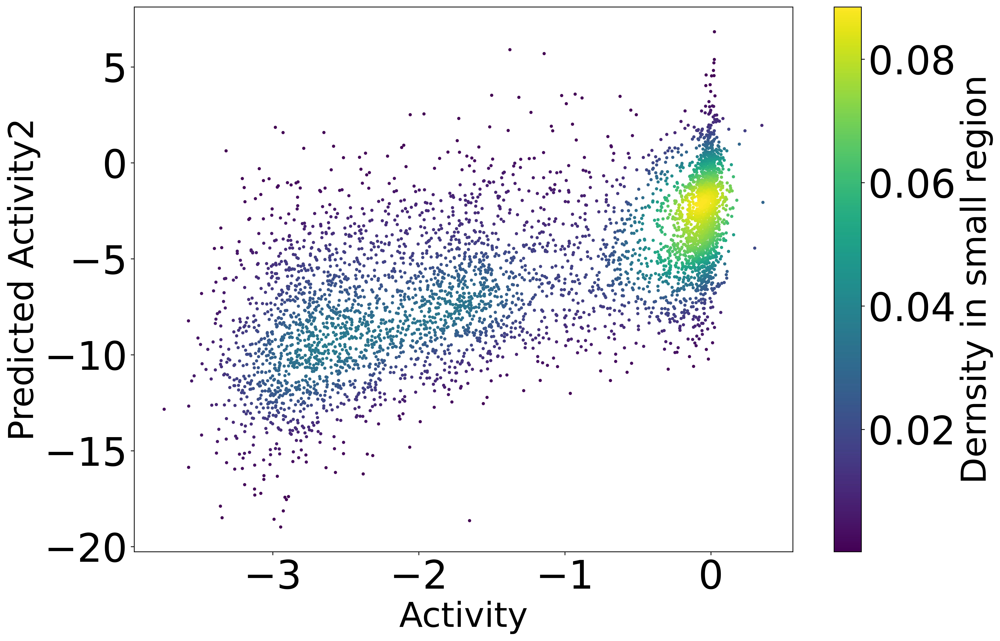

In [12]:
r2 = x4['Activity']
r1 = x4["Predicted Activity2"]
xy = np.vstack([r2,r1])
z = gaussian_kde(xy)(xy)
fig = plt.figure(figsize=(15, 10), dpi=600)
plt.scatter( r2, r1, c=z, s=5)

cb = plt.colorbar()
cb.set_label(label="Dernsity in small region", size=lsize)
cb.ax.tick_params(labelsize=nsize)
plt.xlabel('Activity', fontsize=lsize)
plt.ylabel('Predicted Activity2', fontsize=lsize)
plt.tick_params(axis='both', which='major', labelsize=nsize)

print(GetCorrelation(r2, r1))
plt.show()